<a href="https://colab.research.google.com/github/kenleefk-edu/C3669C-2026-05/blob/main/Copy_of_C3659C_L05_Part_2_Object_detection_YOLOv8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# How to Perform Object Detection With YOLOv8

This tutorial is based on the following website:
https://docs.ultralytics.com/models/yolo26


---
### Mount to Google Drive
Mount to your Google Drive to access the images and model files.

In [40]:
# cell id  PLVF6gZ1XCnd

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [41]:
# cell id  uC-SCxvX-FBP

# Copy and paste the path to "L05_images" here.

dataset_location = "/content/drive/MyDrive/C3659C_SDGAI/data/L05_images"

---
### Install Dependencies

In [42]:
# cell id  r6IX49sIXgJe

!pip install ultralytics

---
### Import and load YOLOv8 model.

In [43]:
# cell id  KZ5lYTm1Xq7V

from ultralytics import YOLO

In [44]:
# cell id  F0FZzT25Xqy1

model = YOLO('yolo26n.pt')

---
### Perform Inference

In [45]:
# cell id  bhpvDIbBiRie

import os

In [46]:
# cell id  bnr6NSiwAVKc

%%time
image_path = os.path.join(dataset_location, "CWF_Part_1.jpg") # or file, Path, PIL, OpenCV, numpy, list

# Inference
results = model(image_path)



image 1/1 /content/drive/MyDrive/C3659C_SDGAI/data/L05_images/CWF_Part_1.jpg: 640x640 7 persons, 2 bicycles, 548.3ms
Speed: 12.8ms preprocess, 548.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
CPU times: user 403 ms, sys: 41.2 ms, total: 444 ms
Wall time: 2.35 s


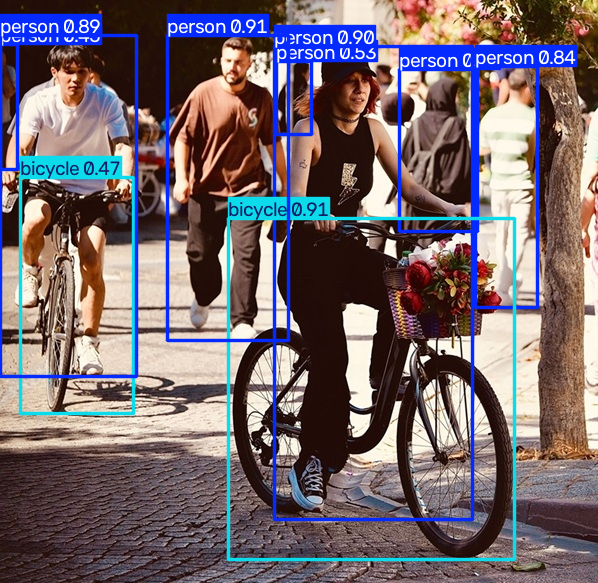

In [47]:
# cell id  pMyyY_7MYRY9

# View results
results[0].show()

In [48]:
# cell id  FvWa3eQVjZ51

# prompt: display the results grouped by the boxes. Include the name of the class.

# Display the results grouped by the boxes with class names
for result in results:
  for box in result.boxes:
    class_index = int(box.cls)
    class_name = model.names[class_index]
    print(f"Box: {box.xyxy.tolist()[0]}, Confidence: {box.conf.tolist()[0]:.2f}, Class: {class_name}")

Box: [167.73577880859375, 35.686222076416016, 288.7598571777344, 340.7906494140625], Confidence: 0.91, Class: person
Box: [228.64825439453125, 218.8876495361328, 514.78271484375, 559.9520874023438], Confidence: 0.91, Class: bicycle
Box: [274.36181640625, 46.04865264892578, 472.580078125, 519.5274047851562], Confidence: 0.90, Class: person
Box: [0.35862430930137634, 35.165042877197266, 136.27540588378906, 376.6992492675781], Confidence: 0.89, Class: person
Box: [475.4256591796875, 66.57846069335938, 537.8418579101562, 307.3814697265625], Confidence: 0.84, Class: person
Box: [399.7299499511719, 69.51312255859375, 477.2333068847656, 231.69471740722656], Confidence: 0.67, Class: person
Box: [276.75897216796875, 61.29074478149414, 311.6537170410156, 134.26068115234375], Confidence: 0.53, Class: person
Box: [20.40114402770996, 177.20126342773438, 133.11785888671875, 413.1646728515625], Confidence: 0.47, Class: bicycle
Box: [0.055609330534935, 44.33608627319336, 17.269559860229492, 169.012512

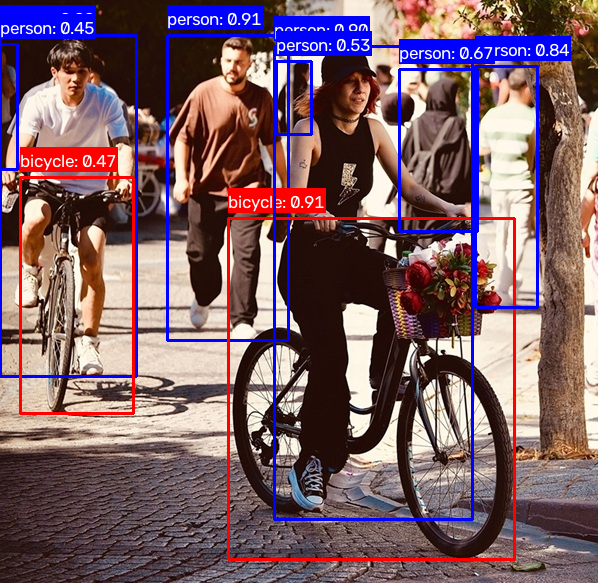

In [51]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Colab-specific function for displaying OpenCV images

# --- Parameters for Visualization (can be adjusted) ---
CONFIDENCE_THRESHOLD = 0.4  # Only display boxes with confidence above this value (changed from 0.5 to 0.4)
# BOX_COLOR and TEXT_COLOR will be set dynamically based on class
BOX_THICKNESS = 2           # Thickness of the bounding box line
FONT = cv2.FONT_HERSHEY_SIMPLEX # Font type for the label text
FONT_SCALE = 0.6            # Scale of the font
TEXT_THICKNESS = 1          # Thickness of the text characters
TEXT_COLOR = (255, 255, 255) # BGR color for the label text. Here it's White.
# --- End Parameters ---

# Load the image using OpenCV from the specified path
# image_path is defined in a previous cell (bnr6NSiwAVKc)
image = cv2.imread(image_path)

# Check if the image was loaded successfully
if image is None:
    print(f"Error: Could not load image from {image_path}")
else:
    # Iterate through the results from the YOLOv8 inference
    for result in results:
        # Iterate through each detected bounding box in the current result
        for box in result.boxes:
            # Get the confidence score for the current detection
            confidence = box.conf.tolist()[0]

            # Get the class index and name of the detected object
            class_index = int(box.cls)
            class_name = model.names[class_index]

            # Apply confidence and class filters
            if confidence > CONFIDENCE_THRESHOLD and (class_name == "person" or class_name == "bicycle"):
                # Set box color based on class
                current_box_color = None
                if class_name == "person":
                    current_box_color = (255, 0, 0) # Blue for person (BGR)
                elif class_name == "bicycle":
                    current_box_color = (0, 0, 255) # Red for bicycle (BGR)

                if current_box_color is not None:
                    # Get the coordinates of the bounding box (x1, y1, x2, y2)
                    # xyxy provides [x_min, y_min, x_max, y_max]
                    x1, y1, x2, y2 = [int(i) for i in box.xyxy.tolist()[0]]

                    # Draw the bounding box on the image
                    # cv2.rectangle(image, (x1, y1), (x2, y2), color, thickness)
                    cv2.rectangle(image, (x1, y1), (x2, y2), current_box_color, BOX_THICKNESS)

                    # Prepare the label text to display class name and confidence
                    label = f"{class_name}: {confidence:.2f}"

                    # Calculate text size to determine its position and background size
                    (text_width, text_height), baseline = cv2.getTextSize(label, FONT, FONT_SCALE, TEXT_THICKNESS)

                    # Determine the y-coordinate for the text, placing it slightly above the box
                    # Adjust if placing above the box would go off-image (y1 < text_height)
                    text_y = y1 - 10 if y1 - 10 > text_height else y1 + text_height + 10
                    text_x = x1

                    # Draw a filled rectangle as a background for the text for better readability
                    # Thickness of -1 means a filled rectangle
                    cv2.rectangle(image, (text_x, text_y - text_height - baseline), (text_x + text_width, text_y + baseline), current_box_color, -1)

                    # Put the label text on the image
                    # cv2.putText(image, text, (x, y), font, fontScale, color, thickness)
                    cv2.putText(image, label, (text_x, text_y), FONT, FONT_SCALE, TEXT_COLOR, TEXT_THICKNESS)

    # Display the labelled image using Colab's specific display function
    cv2_imshow(image)


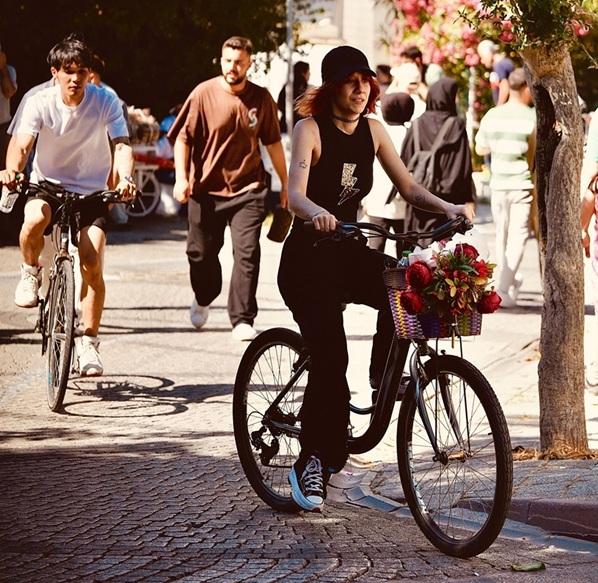

In [53]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the image again to get a fresh copy, as it was modified in GcqvdVpfkIL9
image = cv2.imread(image_path)

if image is None:
    print(f"Error: Could not load image from {image_path}")
else:
    # --- Parameters for Visualization ---
    CONFIDENCE_THRESHOLD = 0.4
    BOX_THICKNESS = 2
    FONT = cv2.FONT_HERSHEY_SIMPLEX
    FONT_SCALE = 0.6
    TEXT_THICKNESS = 1
    TEXT_COLOR = (255, 255, 255) # White

    # Define colors
    # BLUE = (255, 0, 0) # BGR
    # RED = (0, 0, 255)  # BGR
    CYAN = (255, 255, 0) # BGR for Cyan

    # Helper function to calculate IoU
    def calculate_iou(boxA, boxB):
        # boxA and boxB are in format [x1, y1, x2, y2]
        xA = max(boxA[0], boxB[0])
        yA = max(boxA[1], boxB[1])
        xB = min(boxA[2], boxB[2])
        yB = min(boxA[3], boxB[3])

        interArea = max(0, xB - xA) * max(0, yB - yA)

        boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
        boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

        unionArea = float(boxAArea + boxBArea - interArea)
        if unionArea == 0:
            return 0.0

        iou = interArea / unionArea
        return iou

    person_detections = []
    bicycle_detections = []

    # Extract all relevant detections first
    for result in results:
        for box in result.boxes:
            confidence = box.conf.tolist()[0]
            class_index = int(box.cls)
            class_name = model.names[class_index]
            xyxy = [int(i) for i in box.xyxy.tolist()[0]]

            if confidence > CONFIDENCE_THRESHOLD:
                if class_name == "person":
                    person_detections.append({'box': box, 'conf': confidence, 'xyxy': xyxy, 'used': False})
                elif class_name == "bicycle":
                    bicycle_detections.append({'box': box, 'conf': confidence, 'xyxy': xyxy, 'used': False})

    riding_pairs = []
    # Find overlapping person and bicycle pairs
    for p_idx, p_info in enumerate(person_detections):
        if p_info['used']:
            continue
        for b_idx, b_info in enumerate(bicycle_detections):
            if b_info['used']:
                continue

            iou = calculate_iou(p_info['xyxy'], b_info['xyxy'])

            if iou > 0.5: # Overlap ratio more than 50%
                riding_pairs.append({'person': p_info, 'bicycle': b_info})
                person_detections[p_idx]['used'] = True # Mark as used
                bicycle_detections[b_idx]['used'] = True # Mark as used
                break # Move to next person, as this bicycle is now used by this person.

    # Draw bounding boxes for persons not riding a bicycle (Removed as per user request)
    # for p_info in person_detections:
    #     if not p_info['used']:
    #         x1, y1, x2, y2 = p_info['xyxy']
    #         label = f"person: {p_info['conf']:.2f}"
    #         cv2.rectangle(image, (x1, y1), (x2, y2), BLUE, BOX_THICKNESS)
    #         (text_width, text_height), baseline = cv2.getTextSize(label, FONT, FONT_SCALE, TEXT_THICKNESS)
    #         text_y = y1 - 10 if y1 - 10 > text_height else y1 + text_height + 10
    #         cv2.rectangle(image, (x1, text_y - text_height - baseline), (x1 + text_width, text_y + baseline), BLUE, -1)
    #         cv2.putText(image, label, (x1, text_y), FONT, FONT_SCALE, TEXT_COLOR, TEXT_THICKNESS)

    # Draw bounding boxes for bicycles not being ridden (Removed as per user request)
    # for b_info in bicycle_detections:
    #     if not b_info['used']:
    #         x1, y1, x2, y2 = b_info['xyxy']
    #         label = f"bicycle: {b_info['conf']:.2f}"
    #         cv2.rectangle(image, (x1, y1), (x2, y2), RED, BOX_THICKNESS)
    #         (text_width, text_height), baseline = cv2.getTextSize(label, FONT, FONT_SCALE, TEXT_THICKNESS)
    #         text_y = y1 - 10 if y1 - 10 > text_height else y1 + text_height + 10
    #         cv2.rectangle(image, (x1, text_y - text_height - baseline), (x1 + text_width, text_y + baseline), RED, -1)
    #         cv2.putText(image, label, (x1, text_y), FONT, FONT_SCALE, TEXT_COLOR, TEXT_THICKNESS)

    # Draw bounding boxes for persons riding bicycles
    for pair in riding_pairs:
        p_xyxy = pair['person']['xyxy']
        b_xyxy = pair['bicycle']['xyxy']

        # Calculate merged bounding box to encompass both person and bicycle
        mx1 = min(p_xyxy[0], b_xyxy[0])
        my1 = min(p_xyxy[1], b_xyxy[1])
        mx2 = max(p_xyxy[2], b_xyxy[2])
        my2 = max(p_xyxy[3], b_xyxy[3])

        label = "person riding bicycle"

        cv2.rectangle(image, (mx1, my1), (mx2, my2), CYAN, BOX_THICKNESS)
        (text_width, text_height), baseline = cv2.getTextSize(label, FONT, FONT_SCALE, TEXT_THICKNESS)
        text_y = my1 - 10 if my1 - 10 > text_height else my1 + text_height + 10
        cv2.rectangle(image, (mx1, text_y - text_height - baseline), (mx1 + text_width, text_y + baseline), CYAN, -1)
        cv2.putText(image, label, (mx1, text_y), FONT, FONT_SCALE, TEXT_COLOR, TEXT_THICKNESS)

    cv2_imshow(image)

### Visualizing 'Person Riding Bicycle' with Different Overlap Ratios

Let's see how changing the overlap ratio between 'person' and 'bicycle' bounding boxes affects the 'person riding bicycle' detection. We will iterate through overlap ratios from 10% to 50%.

Displaying 'person riding bicycle' for overlap ratio > 10%


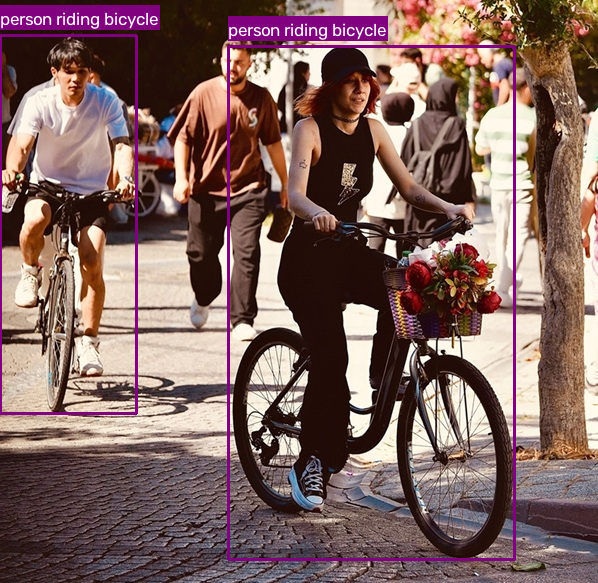



Displaying 'person riding bicycle' for overlap ratio > 20%


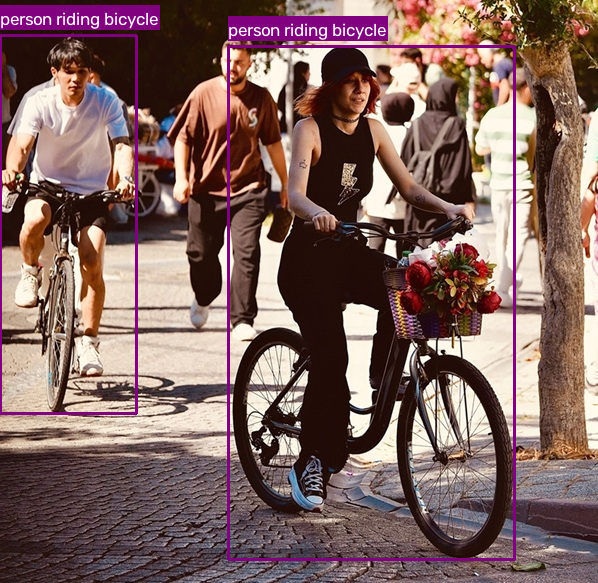



Displaying 'person riding bicycle' for overlap ratio > 30%


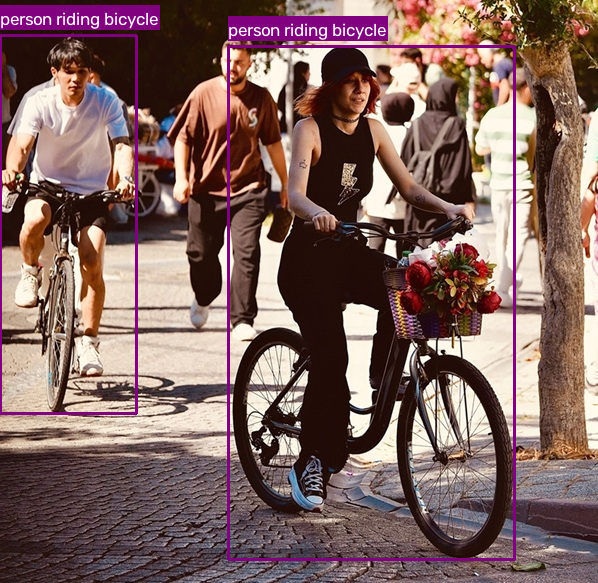



Displaying 'person riding bicycle' for overlap ratio > 40%


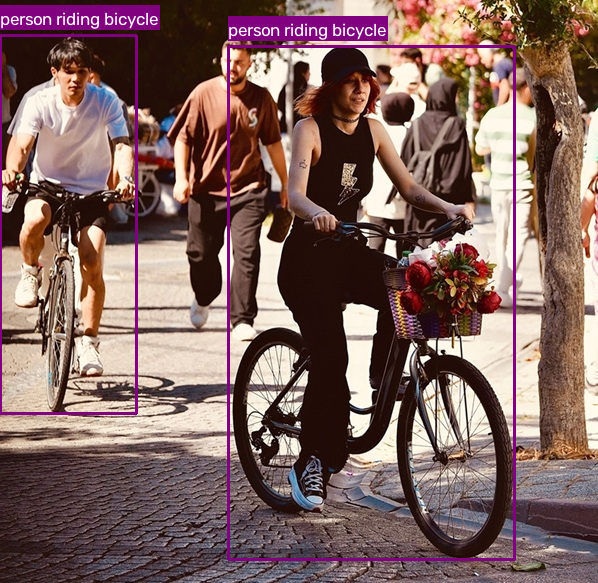



Displaying 'person riding bicycle' for overlap ratio > 50%


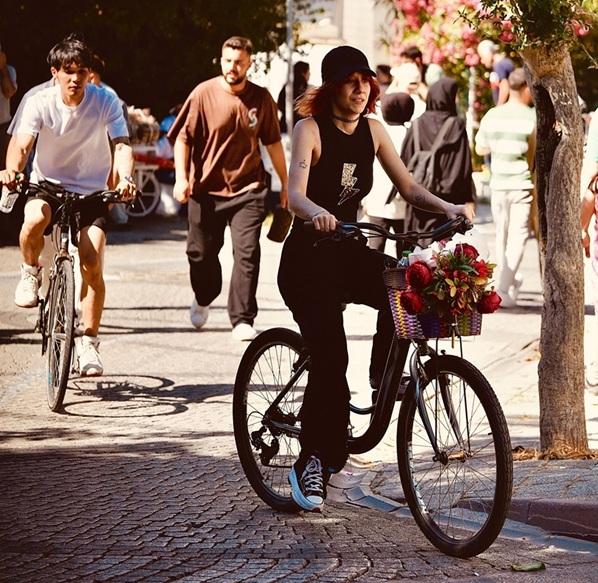

In [56]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# --- Parameters for Visualization ---
CONFIDENCE_THRESHOLD = 0.4
BOX_THICKNESS = 2
FONT = cv2.FONT_HERSHEY_SIMPLEX
FONT_SCALE = 0.6
TEXT_THICKNESS = 1
TEXT_COLOR = (255, 255, 255) # White
PURPLE = (128, 0, 128) # BGR for Purple

# Helper function to calculate IoU
def calculate_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA) * max(0, yB - yA)

    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1]) # Corrected b_box[1] to boxB[1]

    unionArea = float(boxAArea + boxBArea - interArea)
    if unionArea == 0:
        return 0.0

    iou = interArea / unionArea
    return iou

overlap_ratios = [0.1, 0.2, 0.3, 0.4, 0.5]

for iou_threshold in overlap_ratios:
    print(f"Displaying 'person riding bicycle' for overlap ratio > {iou_threshold*100:.0f}%")

    # Reload the image for each iteration to start fresh
    image_display = cv2.imread(image_path)

    if image_display is None:
        print(f"Error: Could not load image from {image_path}")
        continue

    person_detections = []
    bicycle_detections = []

    # Extract all relevant detections first
    for result in results:
        for box in result.boxes:
            confidence = box.conf.tolist()[0]
            class_index = int(box.cls)
            class_name = model.names[class_index]
            xyxy = [int(i) for i in box.xyxy.tolist()[0]]

            if confidence > CONFIDENCE_THRESHOLD:
                if class_name == "person":
                    person_detections.append({'box': box, 'conf': confidence, 'xyxy': xyxy, 'used': False})
                elif class_name == "bicycle":
                    bicycle_detections.append({'box': box, 'conf': confidence, 'xyxy': xyxy, 'used': False})

    riding_pairs = []
    # Find overlapping person and bicycle pairs based on current iou_threshold
    for p_idx, p_info in enumerate(person_detections):
        if p_info['used']:
            continue
        for b_idx, b_info in enumerate(bicycle_detections):
            if b_info['used']:
                continue

            iou = calculate_iou(p_info['xyxy'], b_info['xyxy'])

            if iou > iou_threshold: # Use the current iou_threshold
                riding_pairs.append({'person': p_info, 'bicycle': b_info})
                person_detections[p_idx]['used'] = True
                bicycle_detections[b_idx]['used'] = True
                break

    # Draw bounding boxes for persons riding bicycles
    for pair in riding_pairs:
        p_xyxy = pair['person']['xyxy']
        b_xyxy = pair['bicycle']['xyxy']

        # Calculate merged bounding box
        mx1 = min(p_xyxy[0], b_xyxy[0])
        my1 = min(p_xyxy[1], b_xyxy[1])
        mx2 = max(p_xyxy[2], b_xyxy[2])
        my2 = max(p_xyxy[3], b_xyxy[3])

        label = "person riding bicycle"

        cv2.rectangle(image_display, (mx1, my1), (mx2, my2), PURPLE, BOX_THICKNESS)
        (text_width, text_height), baseline = cv2.getTextSize(label, FONT, FONT_SCALE, TEXT_THICKNESS)
        text_y = my1 - 10 if my1 - 10 > text_height else my1 + text_height + 10
        cv2.rectangle(image_display, (mx1, text_y - text_height - baseline), (mx1 + text_width, text_y + baseline), PURPLE, -1)
        cv2.putText(image_display, label, (mx1, text_y), FONT, FONT_SCALE, TEXT_COLOR, TEXT_THICKNESS)

    cv2_imshow(image_display)
    print("\n") # Add a newline for better separation between images

### Exploring 'Person Riding Bicycle' Detections with Specific Overlap Ratios

Let's investigate the 'person riding bicycle' detections with specific overlap ratios: 50%, 45%, and 40%, to observe subtle differences in detection.

Displaying 'person riding bicycle' for overlap ratio > 50%


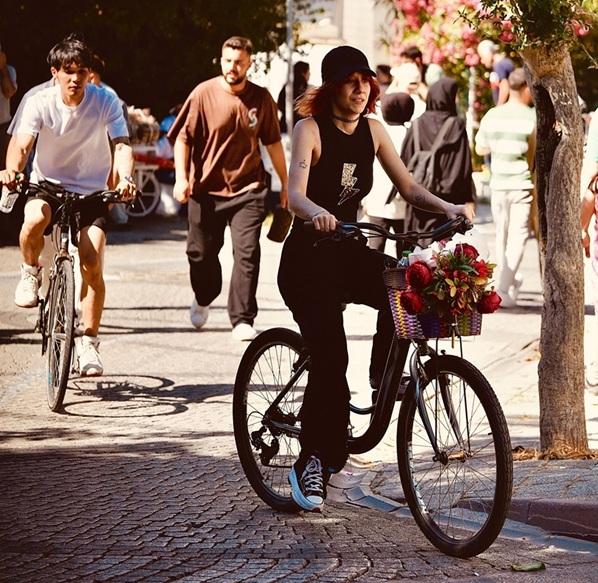



Displaying 'person riding bicycle' for overlap ratio > 45%


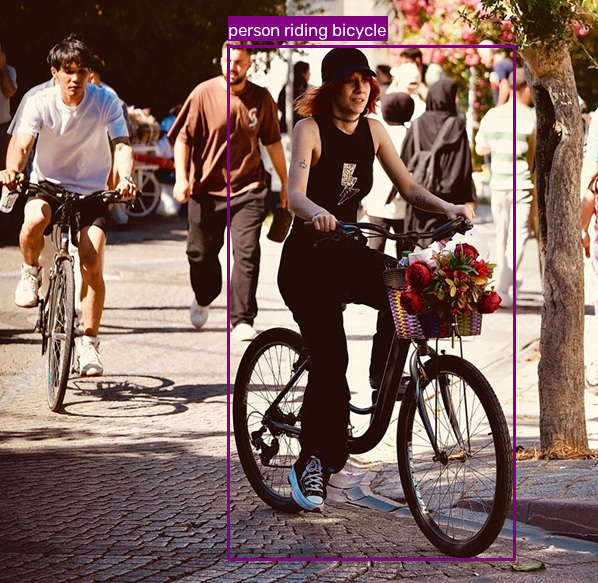



Displaying 'person riding bicycle' for overlap ratio > 40%


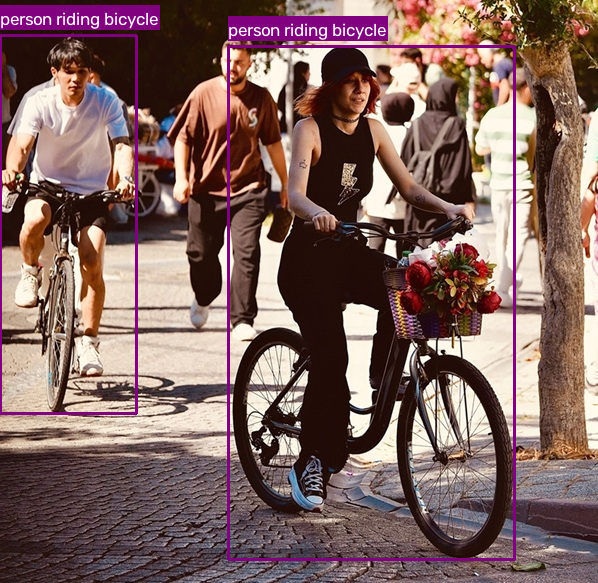

In [57]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# --- Parameters for Visualization ---
CONFIDENCE_THRESHOLD = 0.4
BOX_THICKNESS = 2
FONT = cv2.FONT_HERSHEY_SIMPLEX
FONT_SCALE = 0.6
TEXT_THICKNESS = 1
TEXT_COLOR = (255, 255, 255) # White
PURPLE = (128, 0, 128) # BGR for Purple

# Helper function to calculate IoU
def calculate_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA) * max(0, yB - yA)

    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    unionArea = float(boxAArea + boxBArea - interArea)
    if unionArea == 0:
        return 0.0

    iou = interArea / unionArea
    return iou

# Define specific overlap ratios as requested
overlap_ratios_specific = [0.50, 0.45, 0.40]

for iou_threshold in overlap_ratios_specific:
    print(f"Displaying 'person riding bicycle' for overlap ratio > {iou_threshold*100:.0f}%")

    # Reload the image for each iteration to start fresh
    # image_path is defined in a previous cell (bnr6NSiwAVKc)
    image_display = cv2.imread(image_path)

    if image_display is None:
        print(f"Error: Could not load image from {image_path}")
        continue

    person_detections = []
    bicycle_detections = []

    # Extract all relevant detections first
    for result in results:
        for box in result.boxes:
            confidence = box.conf.tolist()[0]
            class_index = int(box.cls)
            class_name = model.names[class_index]
            xyxy = [int(i) for i in box.xyxy.tolist()[0]]

            if confidence > CONFIDENCE_THRESHOLD:
                if class_name == "person":
                    person_detections.append({'box': box, 'conf': confidence, 'xyxy': xyxy, 'used': False})
                elif class_name == "bicycle":
                    bicycle_detections.append({'box': box, 'conf': confidence, 'xyxy': xyxy, 'used': False})

    riding_pairs = []
    # Find overlapping person and bicycle pairs based on current iou_threshold
    for p_idx, p_info in enumerate(person_detections):
        if p_info['used']:
            continue
        for b_idx, b_info in enumerate(bicycle_detections):
            if b_info['used']:
                continue

            iou = calculate_iou(p_info['xyxy'], b_info['xyxy'])

            if iou > iou_threshold: # Use the current iou_threshold
                riding_pairs.append({'person': p_info, 'bicycle': b_info})
                person_detections[p_idx]['used'] = True
                bicycle_detections[b_idx]['used'] = True
                break

    # Draw bounding boxes for persons riding bicycles
    for pair in riding_pairs:
        p_xyxy = pair['person']['xyxy']
        b_xyxy = pair['bicycle']['xyxy']

        # Calculate merged bounding box
        mx1 = min(p_xyxy[0], b_xyxy[0])
        my1 = min(p_xyxy[1], b_xyxy[1])
        mx2 = max(p_xyxy[2], b_xyxy[2])
        my2 = max(p_xyxy[3], b_xyxy[3])

        label = "person riding bicycle"

        cv2.rectangle(image_display, (mx1, my1), (mx2, my2), PURPLE, BOX_THICKNESS)
        (text_width, text_height), baseline = cv2.getTextSize(label, FONT, FONT_SCALE, TEXT_THICKNESS)
        text_y = my1 - 10 if my1 - 10 > text_height else my1 + text_height + 10
        cv2.rectangle(image_display, (mx1, text_y - text_height - baseline), (mx1 + text_width, text_y + baseline), PURPLE, -1)
        cv2.putText(image_display, label, (mx1, text_y), FONT, FONT_SCALE, TEXT_COLOR, TEXT_THICKNESS)

    cv2_imshow(image_display)
    print("\n") # Add a newline for better separation between images
